In [1]:
import os
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import sparse
from anndata import AnnData, read_mtx

import scanorama
from matplotlib import gridspec
from matplotlib.colors import ListedColormap, to_hex, Normalize

In [2]:
os.getcwd()
os.chdir(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results')

In [3]:
def read_data(path,bin_size=50):
    df1 = pd.read_csv(path, sep='\t', comment='#', header=0)
    df1.dropna(inplace=True)
    df1['x1'] = (df1['x'] / bin_size).astype(np.int32)
    df1['y1'] = (df1['y'] / bin_size).astype(np.int32)
    df1['pos'] = df1['x1'].astype(str) + "-" + df1['y1'].astype(str)
    bin_data = df1.groupby(['pos', 'geneID'])['MIDCounts'].sum()
    cells = set(x[0] for x in bin_data.index)
    genes = set(x[1] for x in bin_data.index)
    cellsdic = dict(zip(cells, range(0, len(cells))))
    genesdic = dict(zip(genes, range(0, len(genes))))
    rows = [cellsdic[x[0]] for x in bin_data.index]
    cols = [genesdic[x[1]] for x in bin_data.index]
    exp_matrix = sparse.csr_matrix((bin_data.values, (rows, cols))) 
    obs = pd.DataFrame(index=cells)
    var = pd.DataFrame(index=genes)
    adata = AnnData(X=exp_matrix, obs=obs, var=var)
    pos = np.array(list(adata.obs.index.str.split('-', expand=True)), dtype=np.int)
    adata.obsm['spatial'] = pos
    mito_genes = adata.var_names.str.startswith('mt-')
    adata.obs['mt_frac'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    adata.obs['total_counts'] = adata.X.sum(axis=1).A1
    adata.obs['n_genes_by_counts'] = np.count_nonzero(adata.X.toarray(), axis=1)
    return adata

In [4]:
def draw_qc(andata):
    import seaborn
    _, axs = plt.subplots(1, 3, figsize=(18, 5))
    seaborn.violinplot(y=andata.obs['total_counts'], ax=axs[0])
    seaborn.violinplot(y=andata.obs['n_genes_by_counts'], ax=axs[1])
    seaborn.violinplot(y=andata.obs['mt_frac'], ax=axs[2])
    
def draw_qc_2(adata):
    import seaborn as sb
    fig, axs = plt.subplots(1,3, figsize=(18,5))
    fig.suptitle('Covariates for filtering')
    sb.distplot(adata.obs['total_counts'], kde=False, ax = axs[0])
    sb.distplot(adata.obs['n_genes_by_counts'], kde=False, ax = axs[1])
    sb.distplot(adata.obs['mt_frac'], kde=False, ax = axs[2])
    #sb.distplot(adata.obs['total_counts'][adata.obs['total_counts']>3800], kde=False, bins=40, ax = axs[1])

In [5]:
def filter_data( adata,min_counts=1000,max_counts=4500,mito_frac=0.2,min_genes=500,min_cells=1,prefix='A1'):
    
    sc.pp.filter_cells(adata, min_counts = min_counts)
    print(f'Number of cells after min count filter: {adata.n_obs}')
    
    sc.pp.filter_cells(adata, max_counts = max_counts)
    print(f'Number of cells after max count filter: {adata.n_obs}')
    
    adata = adata[adata.obs['mt_frac'] < mito_frac]
    print(f'Number of cells after MT filter: {adata.n_obs}')
    
    sc.pp.filter_cells(adata, min_genes = min_genes)
    print(f'Number of cells after gene filter: {adata.n_obs}')
    
    sc.pp.filter_genes(adata, min_cells=min_cells)
    print(f'Number of genes after cell filter: {adata.n_vars}')
    
    return adata

In [6]:
def normalize_data(adata):
    sc.pp.normalize_total(adata, inplace = True)
    sc.pp.log1p(adata)
    adata.raw = adata
    
    sc.pp.highly_variable_genes(adata)
   # sc.pl.highly_variable_genes(adata)
    adata = adata[:, adata.var['highly_variable']]
    sc.pp.regress_out(adata, ['total_counts', 'mt_frac'])
    sc.pp.scale(adata, max_value=10)

In [3]:
def plot_spatial_distribution(
        adata: AnnData,
        obs_key: list = ["total_counts", "n_genes_by_counts"],
        ncols=2,
        dot_size=None,
        color_list=None,
        invert_y=False
):
    if dot_size is None:
        dot_size = 120000 / adata.shape[0]
    ncols = min(ncols, len(obs_key))
    nrows = np.ceil(len(obs_key) / ncols).astype(int)
    # each panel will have the size of rcParams['figure.figsize']
    fig = plt.figure(figsize=(ncols * 6, nrows * 8))
    left = 0.2 / ncols
    bottom = 0.13 / nrows
    axs = gridspec.GridSpec(
        nrows=nrows,
        ncols=ncols,
        left=left,
        right=1 - (ncols - 1) * left - 0.01 / ncols,
        bottom=bottom,
        top=1 - (nrows - 1) * bottom - 0.1 / nrows,
        # hspace=hspace,
        # wspace=wspace,
    )
    if color_list is None:
        cmap = plt.get_cmap()
    else:
        cmap = ListedColormap(color_list)
    for i, key in enumerate(obs_key):
        # color_data = np.asarray(adata.obs_vector(key), dtype=float)
        color_data = adata.obs_vector(key)
        order = np.argsort(~pd.isnull(color_data), kind="stable")
        spatial_data = np.array(adata.obsm["spatial"])[:, 0: 2]
        color_data = color_data[order]
        spatial_data = spatial_data[order, :]
        ax = fig.add_subplot(axs[i])  # ax = plt.subplot(axs[i]) || ax = fig.add_subplot(axs[1, 1]))
        ax.set_title(key)
        ax.set_yticks([])
        ax.set_xticks([])
        ax.set_xlabel("spatial1")
        ax.set_ylabel("spatial2")
        pathcollection = ax.scatter(
            spatial_data[:, 0],
            spatial_data[:, 1],
            marker=".",
            c=color_data,
            s=dot_size,
            cmap=cmap,
        )
        plt.colorbar(
            pathcollection,
            ax=ax,
            pad=0.01,
            fraction=0.08,
            aspect=30,
        )
        ax.autoscale_view()
        if invert_y:
            ax.invert_yaxis()

In [4]:
def plot_scatter_spatial(adata,color_data,cmap,key,invert_y=True,dot_size=10,figsize=(10, 7),color_list=sc.pl.palettes.default_28): 
    axs = gridspec.GridSpec(1,1)
    fig = plt.figure(figsize=figsize)
    ax1 = fig.add_subplot(axs[0])
    ax1.set_title(key)
    ax1.set_yticks([])
    ax1.set_xticks([])
    ax1.set_xlabel("spatial1")
    ax1.set_ylabel("spatial2")
    spatial_data=adata.obsm['spatial']
    pathcollection= ax1.scatter(spatial_data[:, 0],spatial_data[:, 1],marker=".",c=color_data,s=dot_size,cmap=cmap,)
    color_data=np.asarray(adata.obs['leiden'], dtype=float)
    cmap=ListedColormap(color_list)
    if color_list != []:
        color_dict = {str(k): to_hex(v) for k, v in enumerate(color_list)}
        categories=set(adata.obs[key])
        for label in categories:
            ax1.scatter([], [], c=color_dict[label], label=label)
        ax1.legend(
                frameon=False,
                loc='center left',
                bbox_to_anchor=(1, 0.5),
                ncol=1 
            )
    if invert_y:
        ax1.invert_yaxis()

In [5]:
def pca_and_clustering(adata):
    sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=True)        

def louvain_clustering(adata,n_neighbors=6,figsize=(10, 7),color_list=sc.pl.palettes.default_28):
    #sc.pl.palettes.default_20,sc.pl.palettes.default_28,sc.pl.palettes.default_102
    sc.pp.neighbors(adata,n_neighbors=n_neighbors, n_pcs=40)
    sc.tl.louvain(adata,resolution=1 ,key_added='louvain')
    key='louvain'
    spatial_data=adata.obsm['X_spatial']
    color_data=np.asarray(adata.obs['louvain'], dtype=float)
    cmap=ListedColormap(color_list)
    plot_scatter_spatial(adata,color_data,cmap,key=key,invert_y=True,figsize=figsize,color_list=color_list)
    return(adata)   

def umap_vision(adata):
    sc.tl.umap(adata)
    sc.pl.umap(adata, color='louvain', edges=False,legend_loc='on data',palette=sc.pl.palettes.default_28)

In [8]:
path11=r'E:\projects\spacial\mm_brain\added_data\GEM\FP200000459BR_A1.bin1.Lasso.1.gem'
path12=r'E:\projects\spacial\mm_brain\added_data\GEM\FP200000459BR_A1.bin1.Lasso.2.gem'
path13=r'E:\projects\spacial\mm_brain\added_data\GEM\FP200000459BR_A1.bin1.Lasso.3.gem'
path14=r'E:\projects\spacial\mm_brain\added_data\GEM\FP200000459BR_A1.bin1.Lasso.4.gem'
path21=r'E:\projects\spacial\mm_brain\added_data\GEM\FP200000459BR_A2.bin1.Lasso.1.gem'
path22=r'E:\projects\spacial\mm_brain\added_data\GEM\FP200000459BR_A2.bin1.Lasso.2.gem'

In [ ]:
path11='FP200000459BR_A1.bin1.Lasso.1.gem'
path12='FP200000459BR_A1.bin1.Lasso.2.gem'
path13='FP200000459BR_A1.bin1.Lasso.3.gem'
path14='FP200000459BR_A1.bin1.Lasso.4.gem'
path21='FP200000459BR_A2.bin1.Lasso.1.gem'
path22='FP200000459BR_A2.bin1.Lasso.2.gem'

In [84]:
df21=read_data(path21)
df22=read_data(path22)
df11=read_data(path11)
df12=read_data(path12)
df13=read_data(path13)
df14=read_data(path14)

<ipython-input-3-a89be7ae1ea6>:18: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  pos = np.array(list(adata.obs.index.str.split('-', expand=True)), dtype=np.int)
<ipython-input-3-a89be7ae1ea6>:18: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional

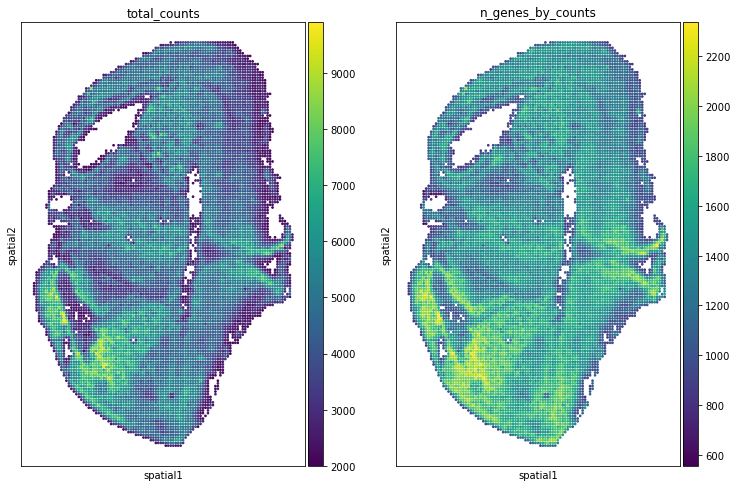

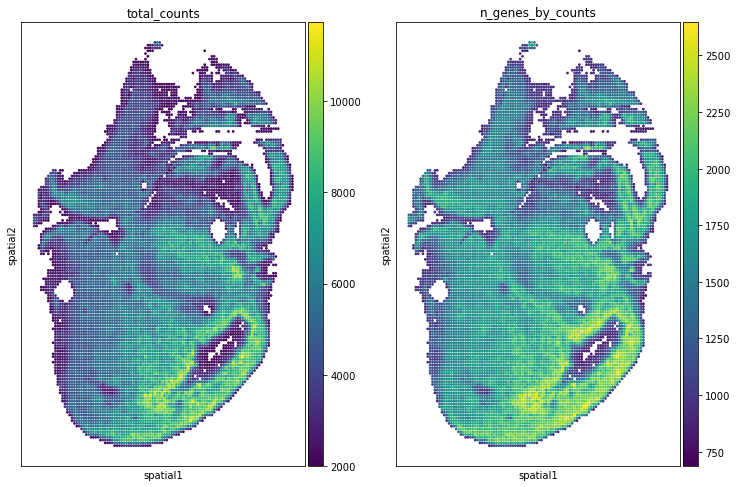

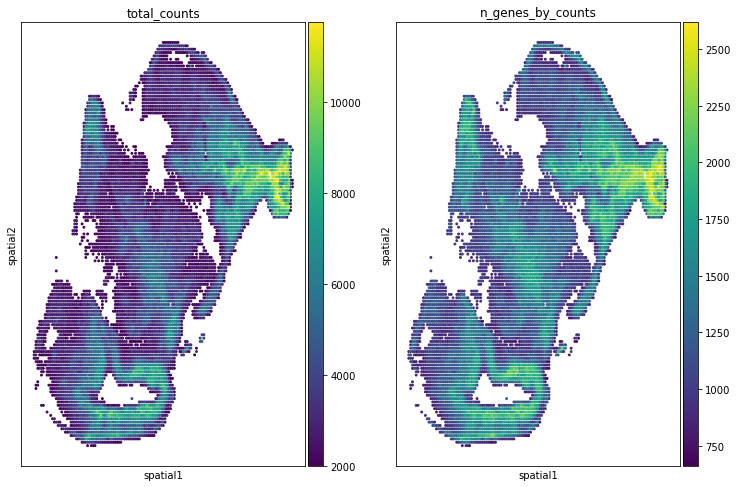

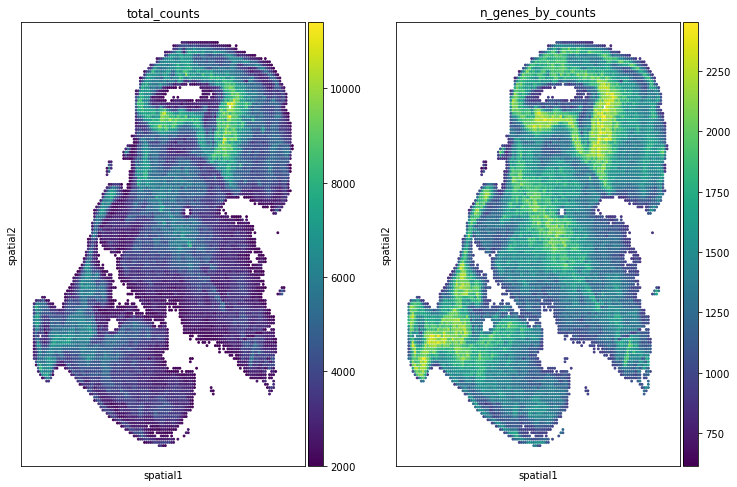

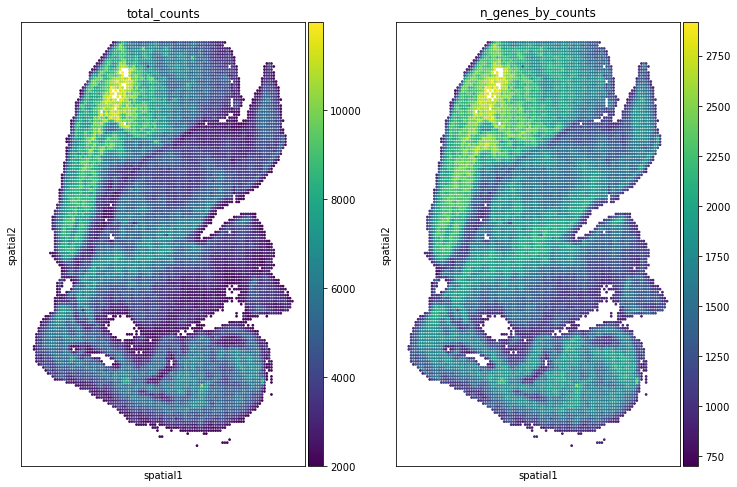

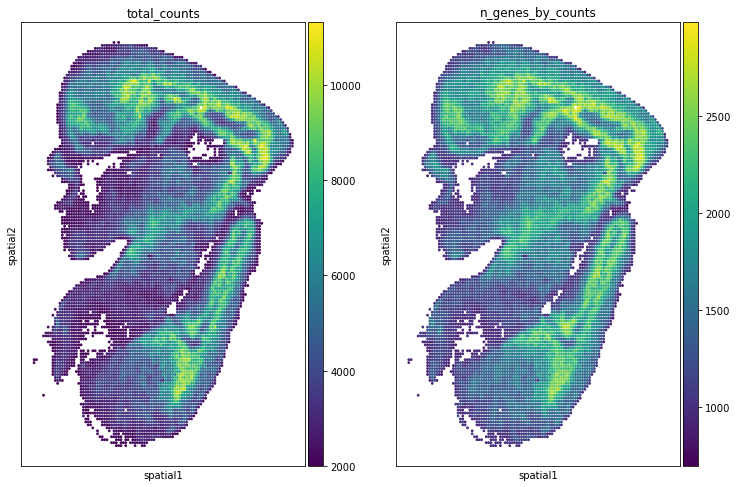

In [158]:
for adata in [df21,df22,df11,df12,df13,df14]:
    plot_spatial_distribution(adata,invert_y=True)
    

In [ ]:
sample_list=[df21,df22,df11,df12,df13,df14]
for i in range(len(sample_list)):
    plot_spatial_distribution(sample_list[i],invert_y=True)
    plt.savefig("A"+str(i)+"_raw.pdf")

In [157]:
df21.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_1.h5ad')
df22.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_2.h5ad')
df11.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_1.h5ad')
df12.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_2.h5ad')
df13.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_3.h5ad')
df14.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_4.h5ad')

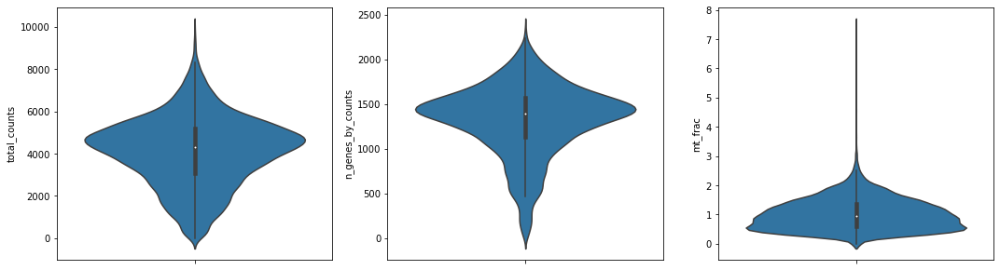

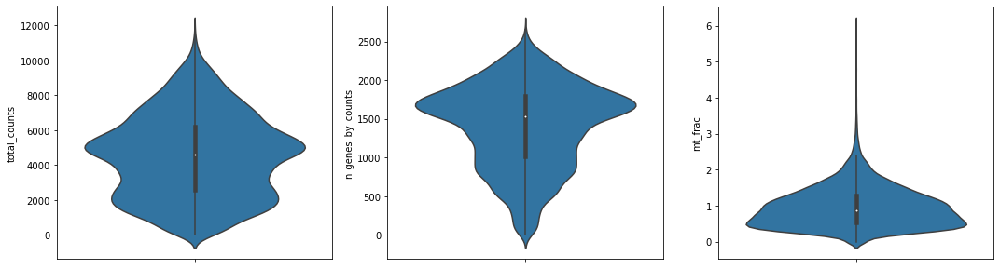

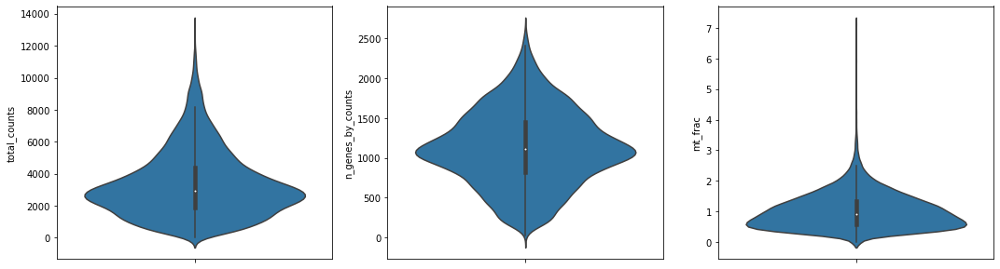

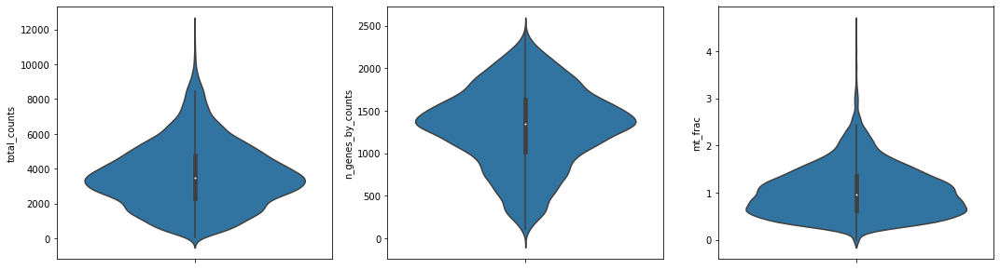

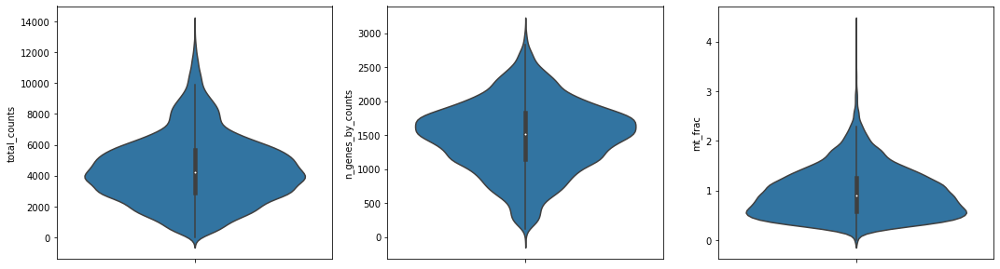

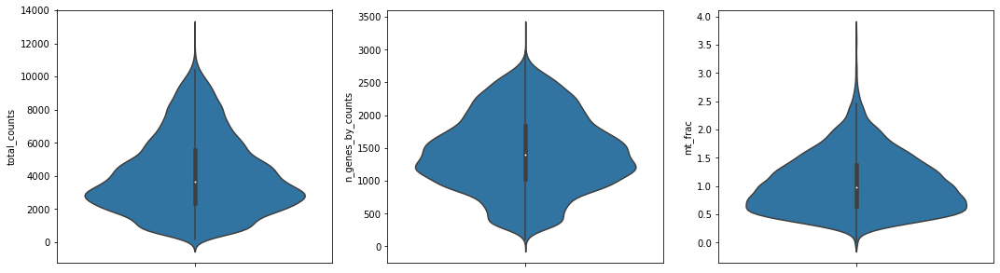

In [113]:
draw_qc(df21)
draw_qc(df22)
draw_qc(df11)
draw_qc(df12)
draw_qc(df13)
draw_qc(df14)

In [ ]:
for i in range(len(sample_list)):
    draw_qc(sample_list[i])
    plt.savefig("A"+str(i)+"_raw_QC.pdf")

D:\anaconda3\envs\spatial\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


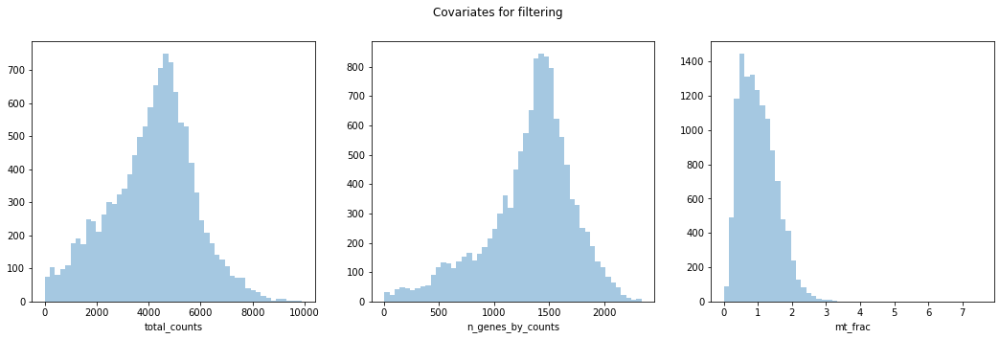

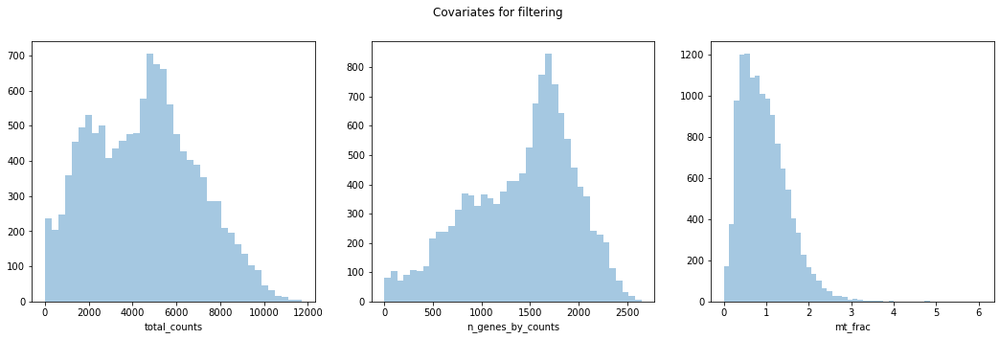

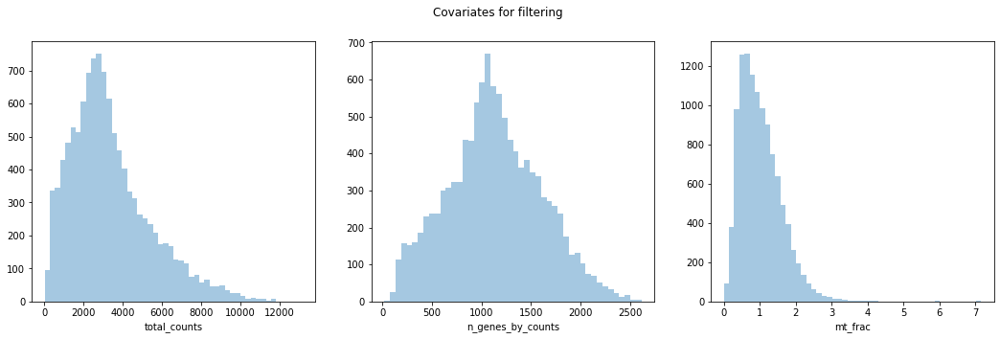

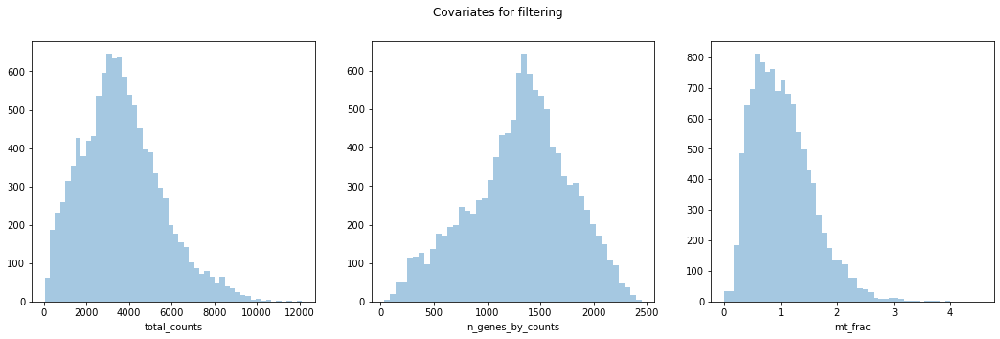

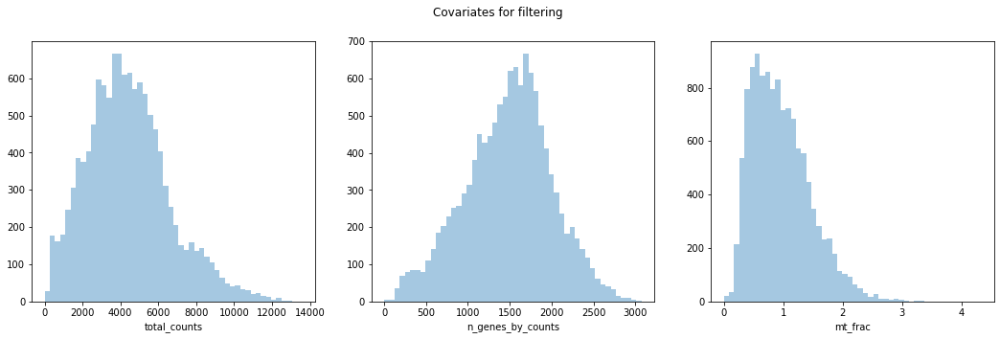

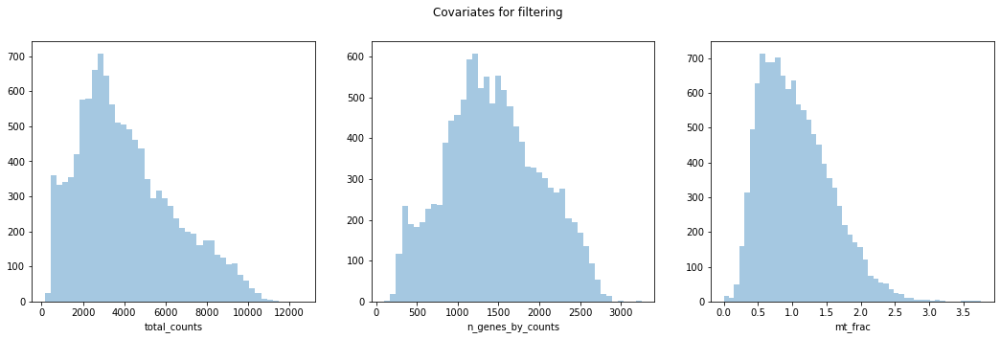

In [22]:
draw_qc_2(df21)
draw_qc_2(df22)
draw_qc_2(df11)
draw_qc_2(df12)
draw_qc_2(df13)
draw_qc_2(df14)

In [150]:
df21=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_1.h5ad')
df22=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_2.h5ad')
df11=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_1.h5ad')
df12=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_2.h5ad')
df13=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_3.h5ad')
df14=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_4.h5ad')

In [159]:
df21=filter_data(df21,min_counts=2000,max_counts=12000,mito_frac=30,min_genes=400,min_cells=1)
df22=filter_data(df22,min_counts=2000,max_counts=12000,mito_frac=30,min_genes=400,min_cells=1)
df11=filter_data(df11,min_counts=2000,max_counts=12000,mito_frac=30,min_genes=400,min_cells=1)
df12=filter_data(df12,min_counts=2000,max_counts=12000,mito_frac=30,min_genes=400,min_cells=1)
df13=filter_data(df13,min_counts=2000,max_counts=12000,mito_frac=30,min_genes=400,min_cells=1)
df14=filter_data(df14,min_counts=2000,max_counts=12000,mito_frac=30,min_genes=400,min_cells=1)

Number of cells after min count filter: 10835
Number of cells after max count filter: 10835
Number of cells after MT filter: 10835


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 10835
Number of genes after cell filter: 22353
Number of cells after min count filter: 10339
Number of cells after max count filter: 10339
Number of cells after MT filter: 10339


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 10339
Number of genes after cell filter: 22497
Number of cells after min count filter: 8217
Number of cells after max count filter: 8217
Number of cells after MT filter: 8217


MemoryError: Unable to allocate 42.2 MiB for an array with shape (11059624,) and data type int32

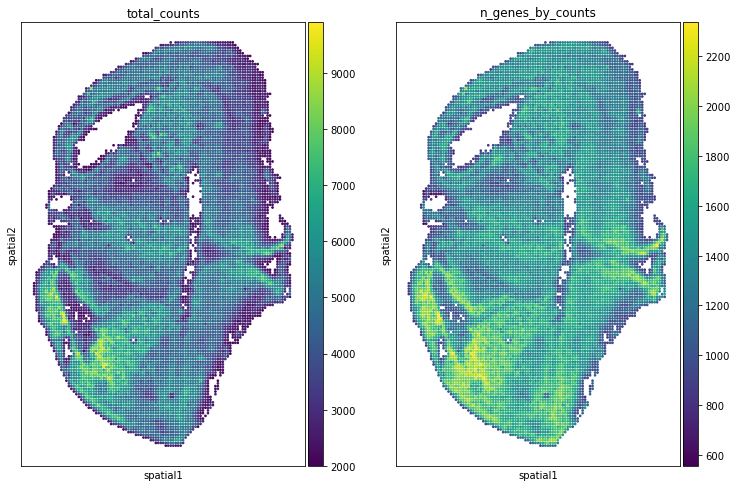

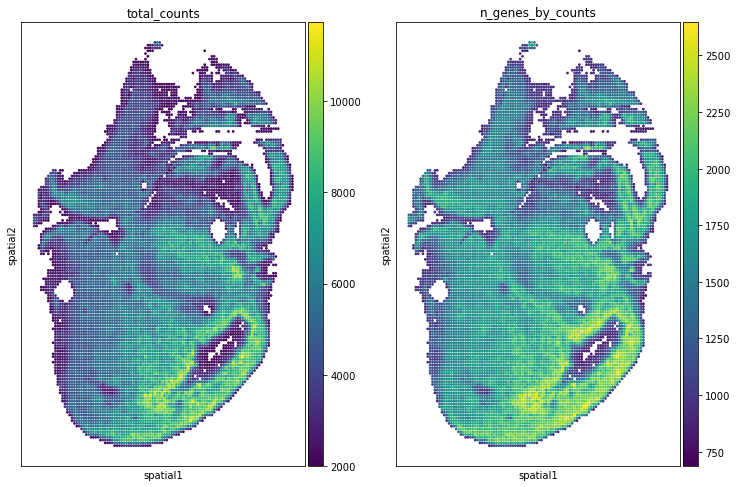

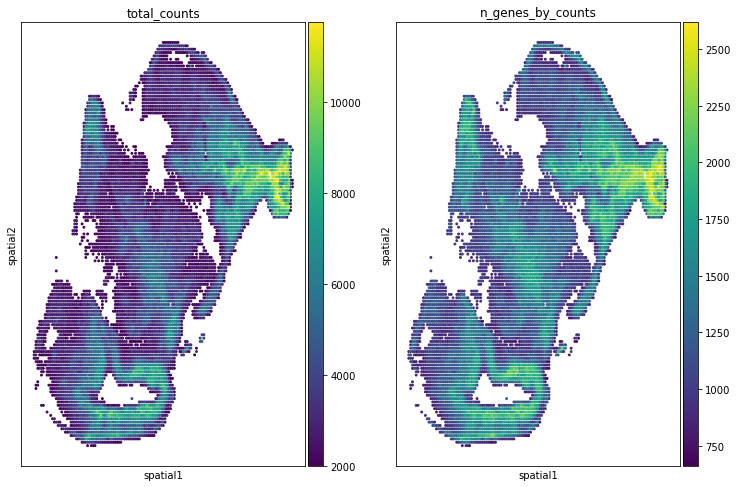

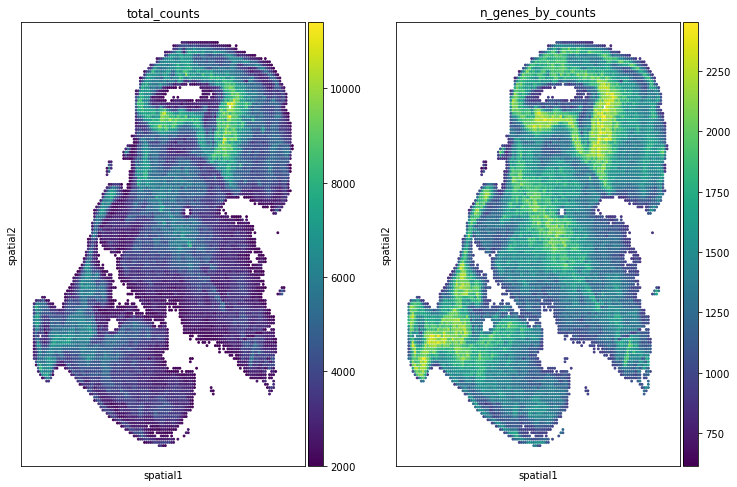

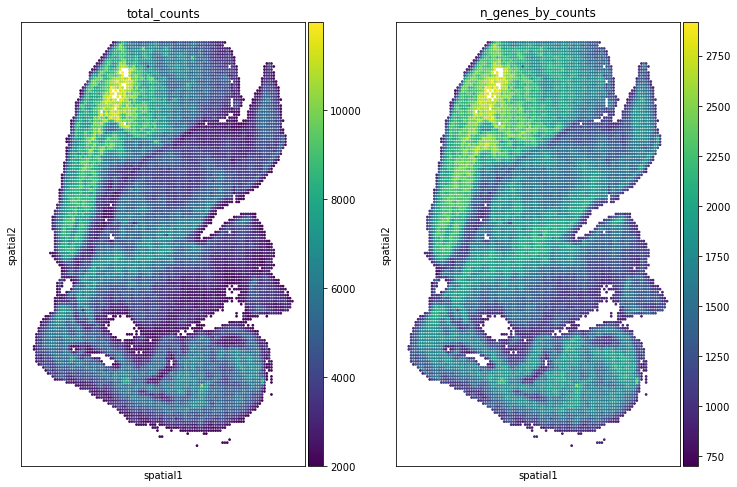

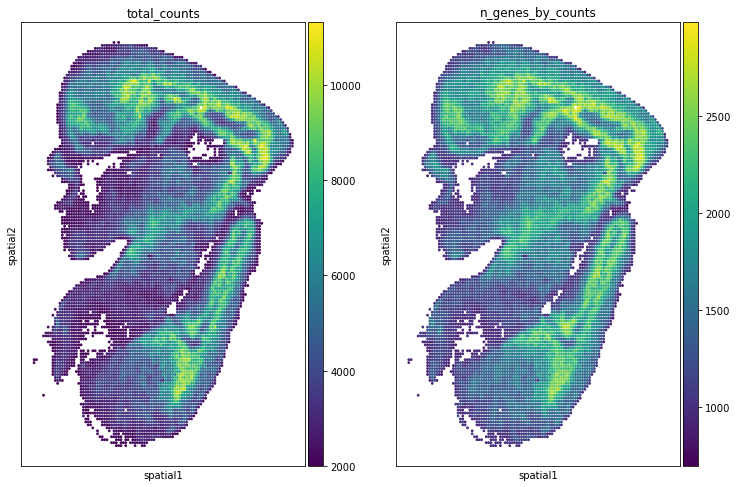

In [160]:
for adata in [df21,df22,df11,df12,df13,df14]:
    plot_spatial_distribution(adata,invert_y=True)
    plt.savefig(".pdf")

In [ ]:
sample_list=[df21,df22,df11,df12,df13,df14]
for i in range(len(sample_list)):
    plot_spatial_distribution(sample_list[i],invert_y=True)
    plt.savefig("A"+str(i)+"_filter_spatial.pdf")

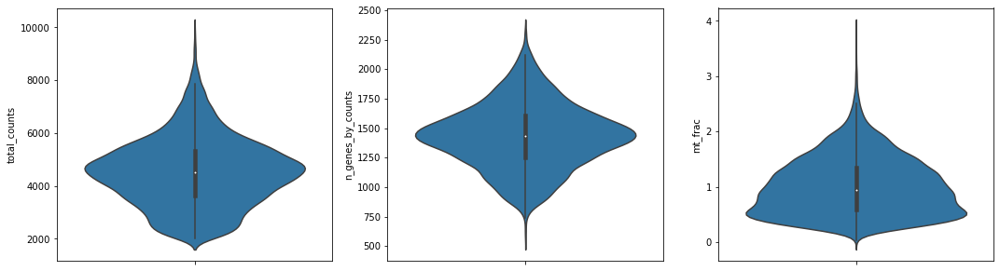

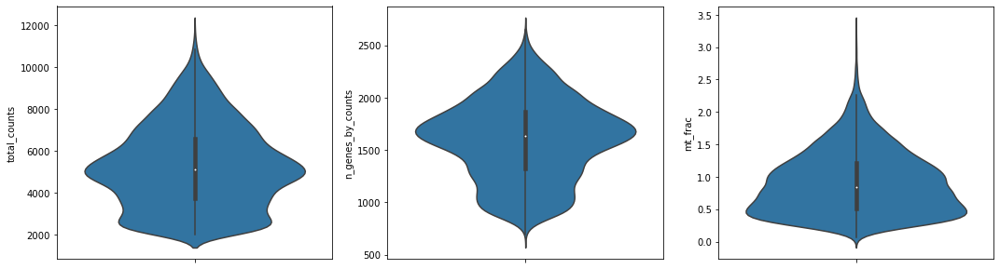

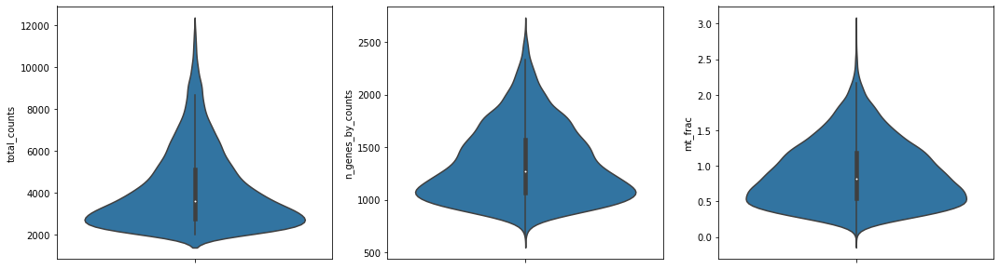

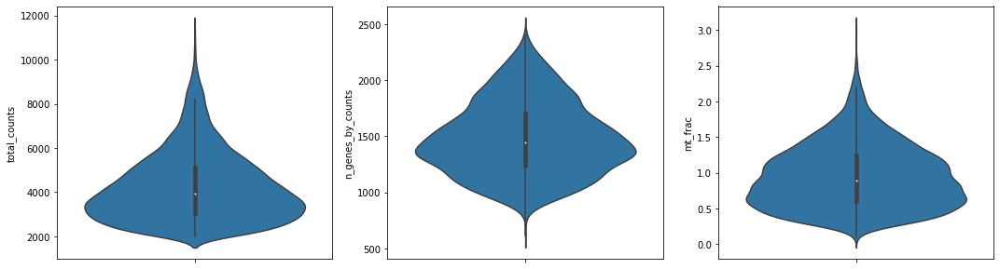

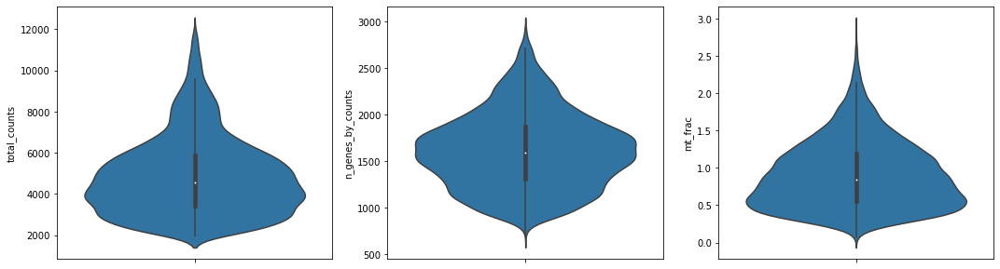

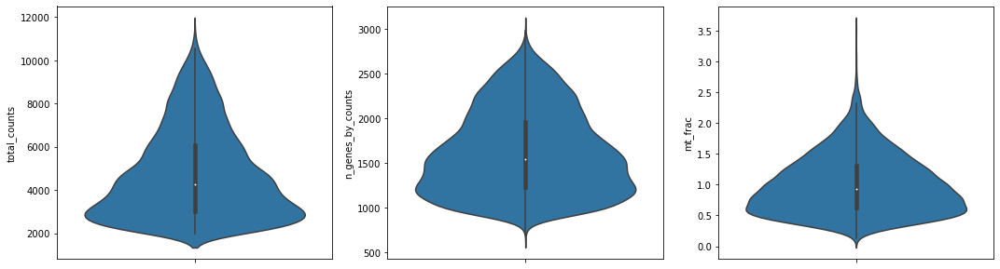

In [161]:
draw_qc(df21)
draw_qc(df22)
draw_qc(df11)
draw_qc(df12)
draw_qc(df13)
draw_qc(df14)

In [ ]:
for i in range(len(sample_list)):
    draw_qc(sample_list[i])
    plt.savefig("A"+str(i)+"_filtered_QC.pdf")

In [162]:
df21.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_1_filtered.h5ad')
df22.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_2_filtered.h5ad')
df11.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_1_filtered.h5ad')
df12.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_2_filtered.h5ad')
df13.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_3_filtered.h5ad')
df14.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_4_filtered.h5ad')

In [10]:
df21=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_1_filtered.h5ad')
df22=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_2_filtered.h5ad')
df11=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_1_filtered.h5ad')
df12=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_2_filtered.h5ad')
df13=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_3_filtered.h5ad')
df14=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A1_4_filtered.h5ad')

In [11]:
for adata in [df21,df22,df11,df12,df13,df14]:
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000, inplace=True)

In [14]:
adatas1=[df21,df22,df11,df12,df13,df14]

In [ ]:
adatas_cor = scanorama.correct_scanpy(adatas1, return_dimred=True) #在Galaxy上运行的

In [ ]:
adata_spatial = adatas_cor[0].concatenate(adatas_cor[1],adatas_cor[2],adatas_cor[3],adatas_cor[4],adatas_cor[5],
                                                     uns_merge="unique")  #在Galaxy上运行的

In [61]:
# adata_spatial.write('All_merged_filtered.h5ad')
adata_spatial.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\All_merged_filtered.h5ad')

In [ ]:
adata_spatial=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\All_merged_filtered.h5ad')

In [73]:
# sc.pp.pca(adata_spatial, n_comps=50, use_highly_variable=False, svd_solver='arpack')

In [ ]:
sc.pp.neighbors(adata_spatial, use_rep="X_scanorama")

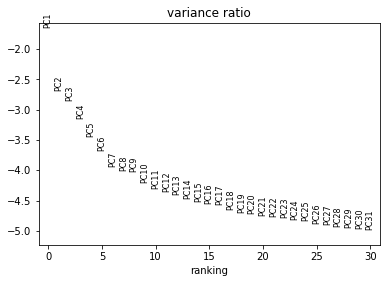

In [75]:
# sc.pl.pca_variance_ratio(adata_spatial, log=True)

In [ ]:
sc.tl.umap(adata_spatial)
sc.tl.leiden(adata_spatial, key_added="leiden")
sc.pl.umap(adata_spatial, color=["leiden",'batch'], palette=sc.pl.palettes.default_20,legend_loc='on data')
plt.savefig("leiden_umap.pdf")

In [76]:
# sc.pp.neighbors(adata_spatial, n_neighbors=10 , use_rep="X_scanorama")

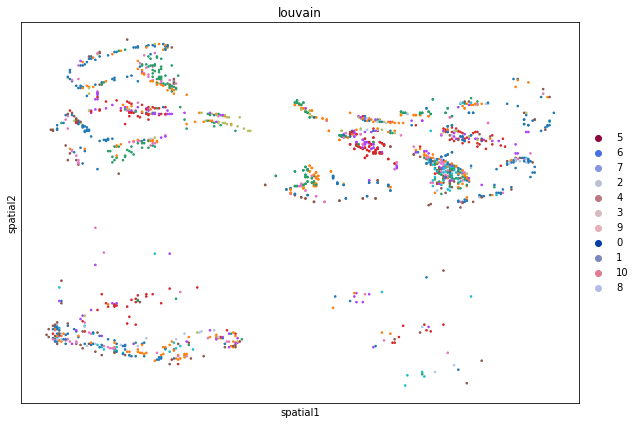

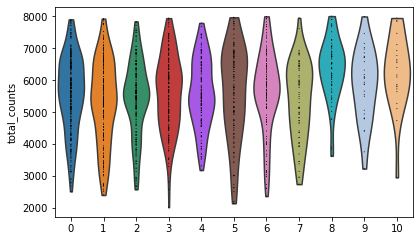

D:\anaconda3\envs\spatial\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


,0,1,2,3,4,5,6,7,8,9,10
0,Aldoc,Mt3,Dlx1,Tagln3,Igfbpl1,Neurod6,Hba-a1,Hes5,Tcf4,Preb,Mt1
1,Mt2,Tmed3,Dlx6os1,Tcf7l2,Tcf7l2,Sox11,Hba-a2,Id3,Dlx6os1,Syt11,Tcf4
2,Pax6,Hes5,Nrep,Stmn3,Abcd3,Nfib,Hbb-bt,Mest,Nfib,Hs2st1,Abhd16a
3,Tcf4,Mest,Rtn1,Tubb3,Syt11,Rnd2,Hbb-y,Nudt9,Igfbp7,Strn3,H2afv
4,Mt1,Phgdh,Stmn2,Nnat,Clybl,Tagln3,Hba-x,Col2a1,Phgdh,Sulf1,Loxl3
5,Id4,H2afv,Nnat,Lhx9,Hes5,Tubb3,Clu,Preb,Sulf1,Banp,Mt3
6,Dhrs7b,Ctsl,Tubb3,Cnih2,Preb,Nrep,Tmed3,Hs2st1,Lxn,Cox6b2,Htra1
7,Pyurf,1500015O10Rik,Sox11,Nrep,Mphosph8,Mpped1,Flot2,H2afv,Mt3,Aldoc,Banp
8,Mt3,Ptn,Igfbp7,Rtn1,Id3,Calm1,Lyar,Rspo3,Psd3,Col2a1,Fam167a
9,Pantr1,Tox3,Dpm1,Sox11,Tagln3,Soga3,Sh3gl1,Podxl,Gm17750,Supt16,Syt11


In [78]:
key='leiden'
spatial_data=adata_spatial.obsm['spatial']
color_data=np.asarray(adata_spatial.obs[key], dtype=float)
color_list=sc.pl.palettes.default_20[:10]
cmap=ListedColormap(color_list)
plot_scatter_spatial(adata_spatial,color_data,cmap,key=key,invert_y=True,dot_size=10,figsize=(10,7))
plt.savefig("all_leiden_cluster_spatial.pdf")

ax = sc.pl.violin(adata_spatial, 'total_counts', groupby='leiden', rotation=0,jitter=False)
plt.savefig("all_leiden_cluster_violin.pdf")

sc.tl.rank_genes_groups(adata_spatial, groupby='leiden',key_added="leiden_DEG", inplace = True)
pd.DataFrame(adata_spatial.uns['leiden_DEG']['names']).head(10)

In [183]:
for i in range(17):
    group_data=sc.get.rank_genes_groups_df(adata_spatial, key='leiden_DEG',group=str(i))
    group_data.to_csv('group'+str(i)+'_markergene.csv')

In [184]:
result = adata_spatial.uns['leiden_DEG']
groups = result['names'].dtype.names
marker=pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})

In [185]:
marker.to_csv("./marker_summary_leiden.csv")

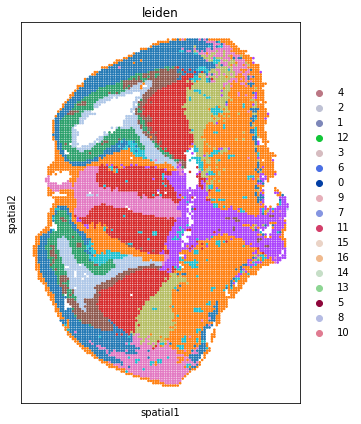

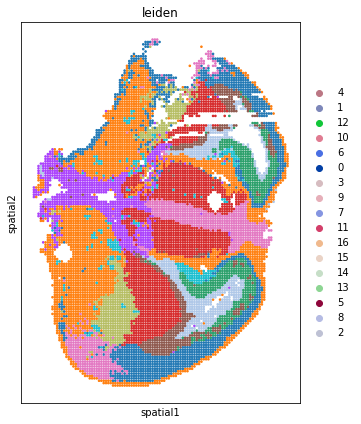

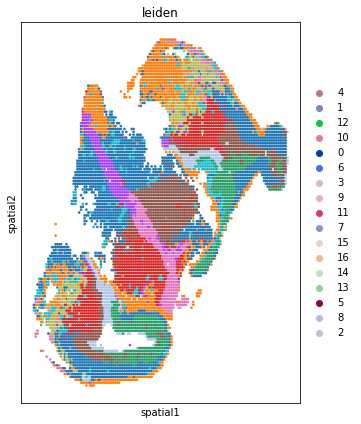

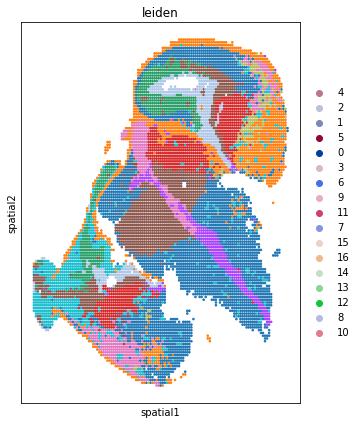

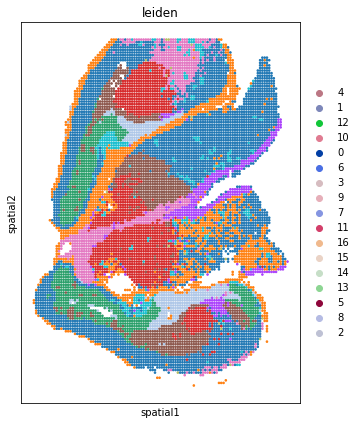

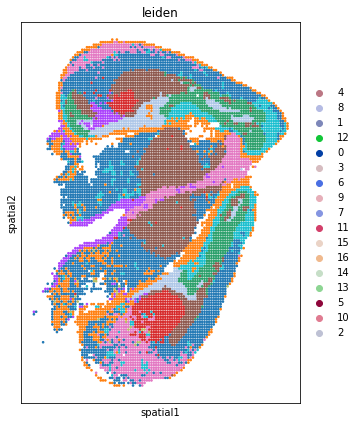

In [188]:
sample_list=['df21','df22','df11','df12','df13','df14']
for i in range(len(sample_list)):
    new=adata_spatial[adata_spatial.obs['batch']==str(i)]
    spatial_data=new.obsm['spatial']
    color_data=np.asarray(new.obs['leiden'], dtype=float)
    color_list=sc.pl.palettes.default_20[:10]
    cmap=ListedColormap(color_list)
    plot_scatter_spatial(new,color_data,cmap,key='leiden',invert_y=True,dot_size=10,figsize=(5,7))
    plt.savefig("A"+str(i)+"_single_cluster_spatial.pdf")

In [ ]:
#adata_spatial.write('All_filtered_clustered_data.h5ad')

adata_spatial.write(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\All_filtered_clustered_data.h5ad')

In [6]:
adata_spatial=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\All_filtered_clustered_data.h5ad')

In [6]:
def get_class_nums(adata_spatial,batch=['0','1','2','3','4','5'],key='louvain'):
    sum_dict={}
    sum_dict['total']=[]

    for item in batch:
        sum_dict['total'].append(adata_spatial.obs[adata_spatial.obs['batch']==item].shape[0])

    for i in range(len(set(adata_spatial.obs[key]))):
        sum_key='cluster'+str(i)
        sum_dict[sum_key]=[]
        for item in batch:
            tmp=adata_spatial[adata_spatial.obs['batch']==item]
            sum_dict[sum_key].append(tmp.obs[tmp.obs[key]==str(i)].shape[0])
            
    a=pd.DataFrame(sum_dict)
    group=['wt_left','wt_right','ko_left','ko_right','het_left','het_right']
    index_=[int(i) for i in batch]
    index_new=[]
    for i in index_:
        index_new.append(group[i])
    a.index=group
    return(a)

In [7]:
a=get_class_nums(adata_spatial,batch=['0','1','2','3','4','5'],key='leiden')
a.to_csv(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\All_cluster_nums.txt',sep='\t',index=1)

In [174]:
a

,total,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16
ko_left,10835,1783,1171,787,73,1130,897,791,524,7,584,399,719,281,463,217,633,376
ko_right,10339,1770,1057,700,153,1000,789,855,552,56,410,463,809,191,465,216,467,386
het_left,8217,1028,883,765,1024,498,553,475,544,641,331,394,169,377,144,219,84,88
het_right,8217,1028,883,765,1024,498,553,475,544,641,331,394,169,377,144,219,84,88
wt_left,10619,964,1573,1142,1596,913,508,863,652,496,456,450,108,239,236,349,0,74
wt_right,9424,790,1584,892,1091,872,364,10,558,1178,681,503,50,215,154,293,2,187


In [19]:
def plot_spatial_in_all_clusters(key,figsize=(12,12),dot_size=10):
    axs = gridspec.GridSpec(2,3)
    fig = plt.figure(figsize=figsize)
    for item in range(6):
        invert_x=[False,True,False,True,False,True]
        invert_y=[True,False,False,False,True,True]
        clusters=['0','2','4','1','3','5']
        new=adata_spatial[adata_spatial.obs['batch']==clusters[item]]
        spatial_data=new.obsm['spatial']
        color_data=np.asarray(new.obs['leiden'], dtype=float)
        color_list=sc.pl.palettes.default_20[:17]
        cmap=ListedColormap(color_list)
        ax1 = fig.add_subplot(axs[item])
        ax1.set_title(key)
        ax1.set_yticks([])
        ax1.set_xticks([])
        ax1.set_xlabel("spatial1")
        ax1.set_ylabel("spatial2")
        spatial_data=new.obsm['spatial']
        pathcollection= ax1.scatter(spatial_data[:, 0],spatial_data[:, 1],marker=".",c=color_data,s=dot_size,cmap=cmap,)
        color_data=np.asarray(new.obs['leiden'], dtype=float)
        if color_list != []:
            color_dict = {str(k): to_hex(v) for k, v in enumerate(color_list)}
            categories=set(new.obs['leiden'])
            for label in categories:
                ax1.scatter([], [], c=color_dict[label], label=label)
            ax1.legend(
                    frameon=False,
                    loc='center left',
                    bbox_to_anchor=(1.15, 0.5),
                    ncol=1 
                )
        if invert_y[item]:
            ax1.invert_yaxis()
        if invert_x[item]:
            ax1.invert_xaxis()

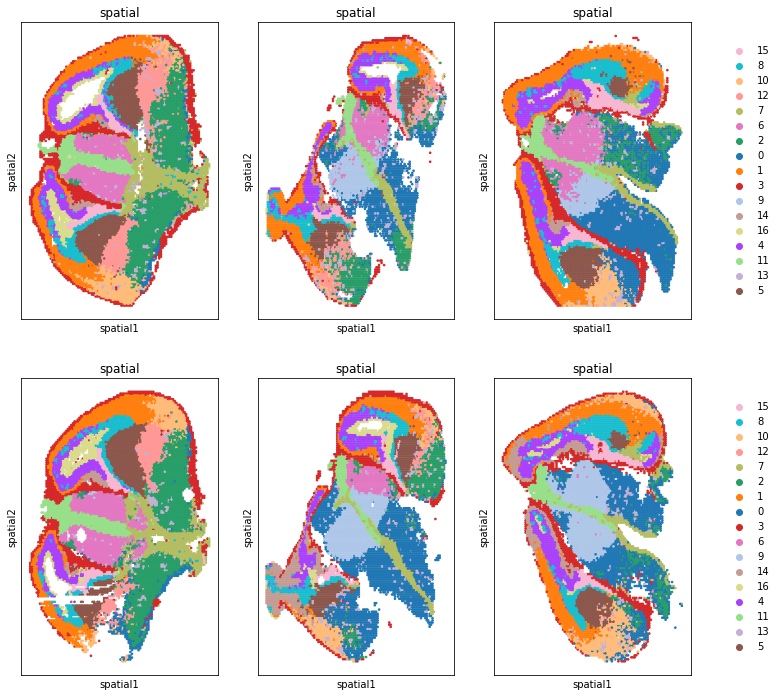

In [20]:
plot_spatial_in_all_clusters(key='spatial',dot_size=10,figsize=(12,12))
#plt.savefig("all_leiden_cluster_spatial.pdf")
plt.savefig(r"E:\projects\spacial\mm_brain\added_data\2021-11-26-results\all_leiden_cluster_spatial.pdf")

In [11]:
def plot_gene_in_all_clusters(key,figsize=(18,4),dot_size=10):
    axs = gridspec.GridSpec(2,3)
    fig = plt.figure(figsize=figsize)

    for item in range(6):
        invert_x=[False,True,False,True,False,True]
        invert_y=[True,False,False,False,True,True]
        
        clusters=['0','2','4','1','3','5']
        new=adata_spatial[adata_spatial.obs['batch']==clusters[item]]
        spatial_data=new.obsm['spatial']
        color_data=np.asarray(new.obs_vector(key), dtype=float)
        cmap=plt.get_cmap('Reds')
        color_list=color_list=sc.pl.palettes.default_20[:11]

        ax1 = fig.add_subplot(axs[item])
        ax1.set_title(key)
        ax1.set_yticks([])
        ax1.set_xticks([])
        ax1.set_xlabel("spatial1")
        ax1.set_ylabel("spatial2")
        spatial_data=new.obsm['spatial']
        pathcollection= ax1.scatter(spatial_data[:, 0],spatial_data[:, 1],marker=".",c=color_data,s=dot_size,cmap=cmap,)
        color_data=np.asarray(new.obs['leiden'], dtype=float)
        cmap=ListedColormap(color_list)
        if invert_y[item]:
            ax1.invert_yaxis()
        if invert_x[item]:
            ax1.invert_xaxis()

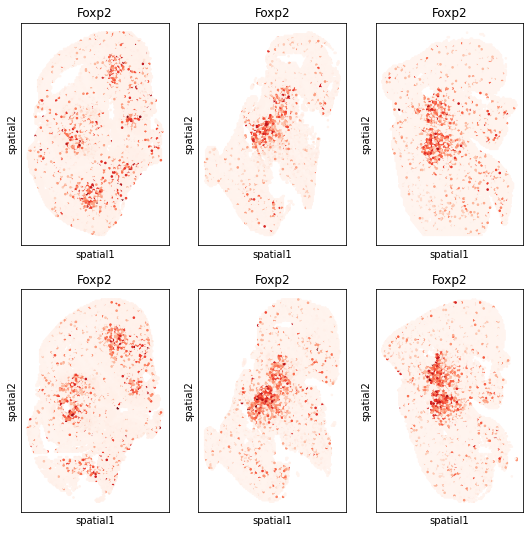

In [12]:
plot_gene_in_all_clusters(key='Foxp2',figsize=(9,9),dot_size=10)
plt.savefig(r"E:\projects\spacial\mm_brain\added_data\2021-11-26-results\Foxp2_cluster_spatial.pdf")

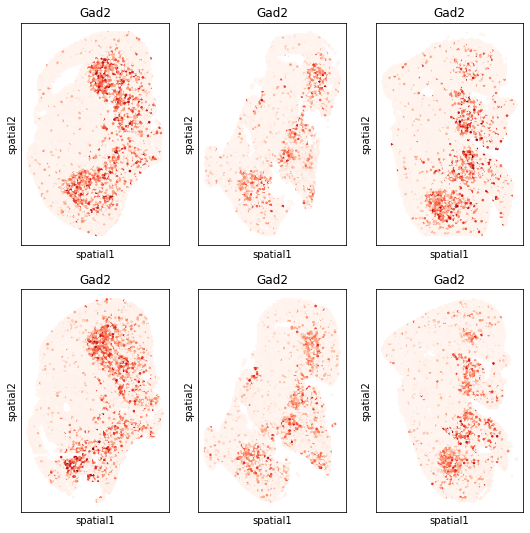

In [14]:
plot_gene_in_all_clusters(key='Gad2',figsize=(9,9),dot_size=10)
plt.savefig("Gad2_cluster_spatial.pdf")

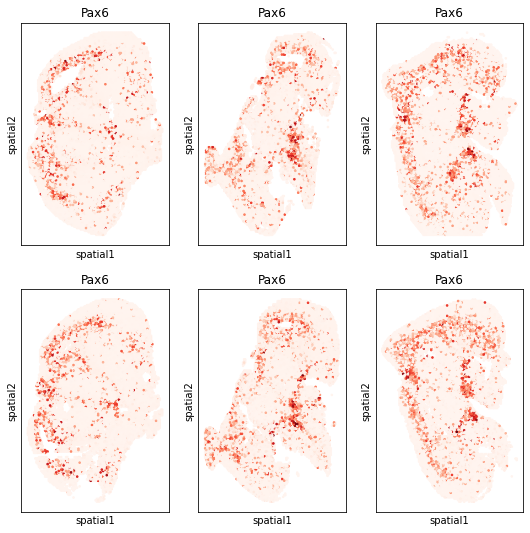

In [15]:
plot_gene_in_all_clusters(key='Pax6',figsize=(9,9),dot_size=10)

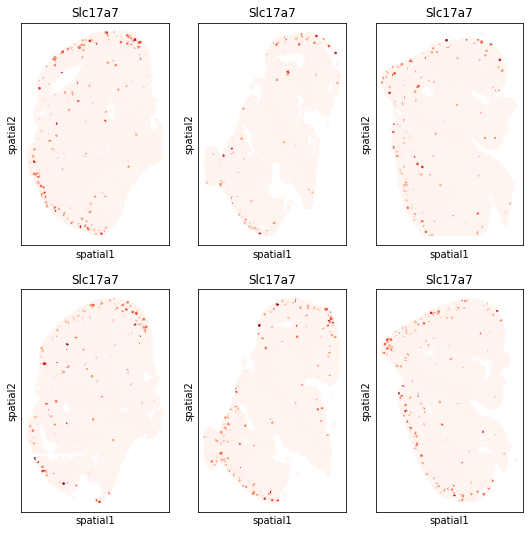

In [16]:
plot_gene_in_all_clusters(key='Slc17a7',figsize=(9,9),dot_size=10)

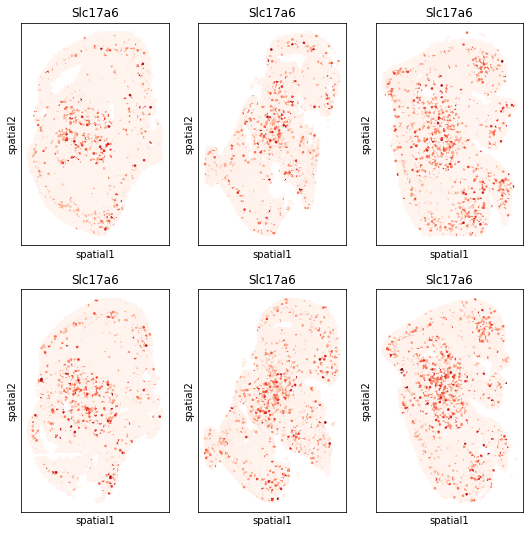

In [17]:
plot_gene_in_all_clusters(key='Slc17a6',figsize=(9,9),dot_size=10)

In [41]:
df21=sc.read(r'E:\projects\spacial\mm_brain\added_data\2021-11-26-results\A2_1.h5ad')

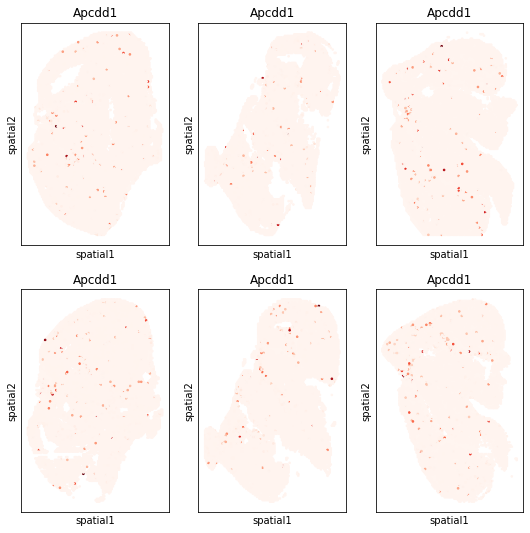

In [40]:
plot_gene_in_all_clusters(df21,key='Apcdd1',figsize=(9,9),dot_size=10)

In [38]:
def plot_gene_in_single_clusters(key,figsize=(18,4),dot_size=10,cluster='4'):
    axs = gridspec.GridSpec(2,3)
    fig = plt.figure(figsize=figsize)

    for item in range(6):
        invert_x=[False,True,False,True,False,True]
        invert_y=[True,False,False,False,True,True]
        
        clusters=['0','2','4','1','3','5']
        new=adata_spatial[adata_spatial.obs['batch']==clusters[item]]
        
        
        df21_cluster3_tmp=new[new.obs['batch']==clusters[item]]
        df21_cluster3=df21_cluster3_tmp[df21_cluster3_tmp.obs['leiden']==cluster]
        df21_cluster3_rest=df21_cluster3_tmp[df21_cluster3_tmp.obs['leiden']!=cluster]
        
        cluster_gene = df21_cluster3[df21_cluster3.obs_vector(key)!=0]
        cluster_non_gene = df21_cluster3[df21_cluster3.obs_vector(key)==0]

        ax1 = fig.add_subplot(axs[item])
        ax1.set_title(key)
        ax1.set_yticks([])
        ax1.set_xticks([])
        ax1.set_xlabel("spatial1")
        ax1.set_ylabel("spatial2")
        spatial_data=new.obsm['spatial']
        
        ax1.scatter(df21_cluster3_rest.obsm['spatial'][:,0],df21_cluster3_rest.obsm['spatial'][:,1],c='beige')
        ax1.scatter(cluster_non_gene.obsm['spatial'][:,0],cluster_non_gene.obsm['spatial'][:,1],s=10,c=sc.pl.palettes.default_20[int(cluster)])
        #ax1.scatter(cluster_gene.obsm['spatial'][:,0],cluster_gene.obsm['spatial'][:,1],s=10,c='Red')
        #ax1.scatter(cluster_gene[:, 0],df21_cluster3[:, 1],marker=".",c=color_data,s=dot_size,cmap=cmap,)
        
        if invert_y[item]:
            ax1.invert_yaxis()
        if invert_x[item]:
            ax1.invert_xaxis()

In [37]:
len(adata_spatial.obs_vector('Gad2'))

58423

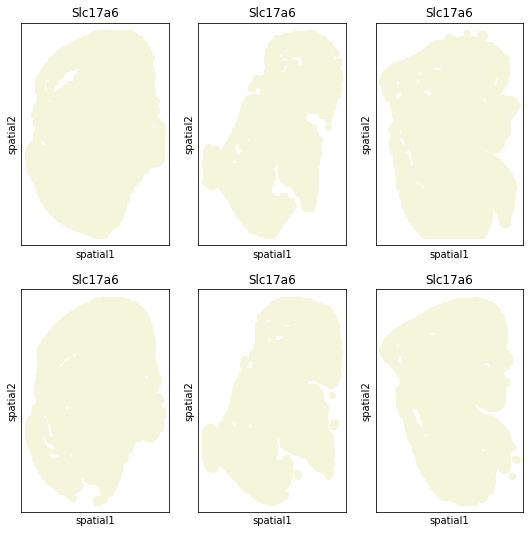

In [39]:
plot_gene_in_single_clusters(key='Slc17a6',figsize=(9,9),dot_size=10,cluster='4')

In [17]:
def plot_specific_clusters(key,figsize=(12,12),cluster='14'):
    axs = gridspec.GridSpec(2,3)
    fig = plt.figure(figsize=figsize)

    for item in range(6):
        invert_x=[False,True,False,True,False,True]
        invert_y=[True,False,False,True,True,True]
        
        groups=['0','2','4','1','3','5']
        
        df21_cluster3_tmp=adata_spatial[adata_spatial.obs['batch']==groups[item]]
        df21_cluster3=df21_cluster3_tmp[df21_cluster3_tmp.obs[key]==cluster]
        df21_cluster3_rest=df21_cluster3_tmp[df21_cluster3_tmp.obs[key]!=cluster]
        
        ax1 = fig.add_subplot(axs[item])
        ax1.set_title(key)
        ax1.set_yticks([])
        ax1.set_xticks([])
        ax1.set_xlabel("spatial1")
        ax1.set_ylabel("spatial2")
        ax1.scatter(df21_cluster3_rest.obsm['spatial'][:,0],df21_cluster3_rest.obsm['spatial'][:,1],c='beige')
        ax1.scatter(df21_cluster3.obsm['spatial'][:,0],df21_cluster3.obsm['spatial'][:,1],s=10,c=sc.pl.palettes.default_20[int(cluster)])
        if invert_y[item]:
            ax1.invert_yaxis()
        if invert_x[item]:
            ax1.invert_xaxis()

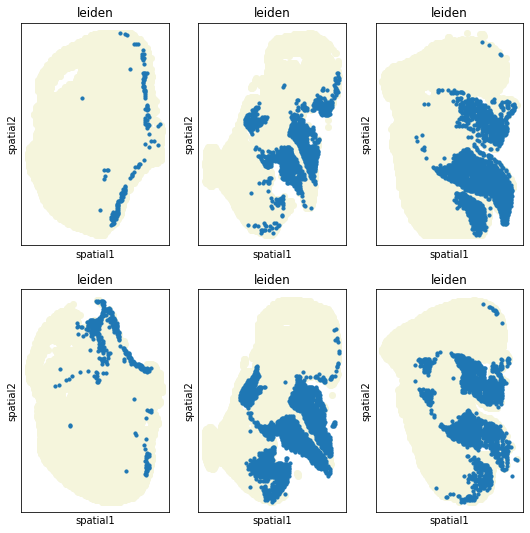

In [18]:
plot_specific_clusters(key='leiden',figsize=(9,9),cluster='0')

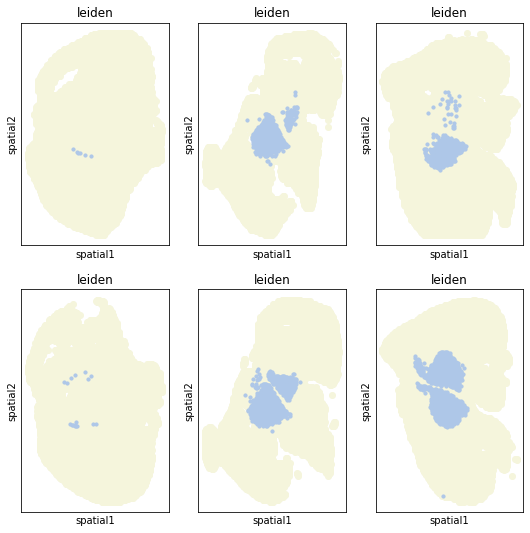

In [29]:
plot_specific_clusters(key='leiden',figsize=(9,9),cluster='9')

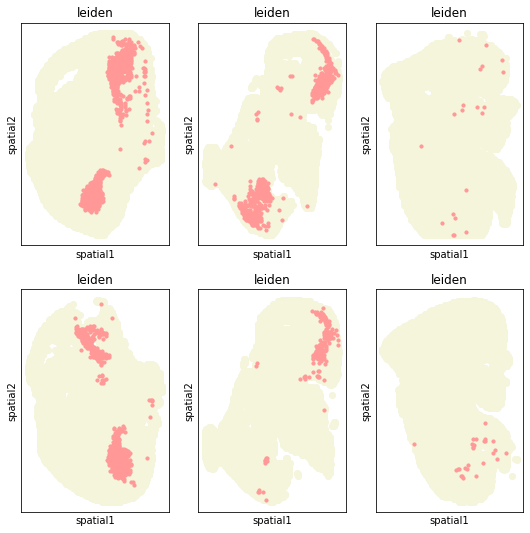

In [32]:
plot_specific_clusters(key='leiden',figsize=(9,9),cluster='12')

In [ ]:
plot_specific_clusters(key='leiden',figsize=(9,9),cluster='0')

In [164]:
def plot_single_specific_cluster(adata_spatial,group='4',cluster='4',key='leiden',figsize=(3,4)):
    df21_cluster3_tmp=adata_spatial[adata_spatial.obs['batch']==group]
    df21_cluster3=df21_cluster3_tmp[df21_cluster3_tmp.obs[key]==cluster]
    df21_cluster3_rest=df21_cluster3_tmp[df21_cluster3_tmp.obs[key]!=cluster]
    plt.figure(figsize=(3,4))
    plt.scatter(df21_cluster3_rest.obsm['spatial'][:,0],df21_cluster3_rest.obsm['spatial'][:,1],c='beige')
    plt.scatter(df21_cluster3.obsm['spatial'][:,0],df21_cluster3.obsm['spatial'][:,1],s=10,c=sc.pl.palettes.default_20[int(cluster)])
    plt.show()

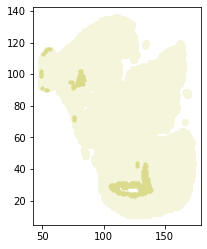

In [193]:
plot_single_specific_cluster(adata_spatial,group='3',cluster='16',key='leiden',figsize=(6,7))

In [ ]:
adata_spatial.obs['leiden_anno'] = adata_spatial.obs['leiden']
adata_spatial.obs['leiden_anno'].cat.categories = ['0:Neuron', '1:Forebrain glutamatergic', '2:Vascular and blood', 
                                                            '3:Cortical glutamatergic', '4:Mesenchyme', '5:Forebrain/Hindbrain glutamatergic',
                                                            '6:Midbrain glutamatergic', '7:Thalamus glutamatergic', '8:Forebrain GABAergic', 
                                                            '9:Forebrain glutamatergic', '10:Forebrain Glioblast', '11:Forebrain Neuroblast',
                                                            '12:hippocampal glutamatergic', '13:Choroid plexus', '14:Forebrain GABAergic', 
                                                            '15:Fornix','16:unknow','17:unkown2']

In [ ]:
sc.pl.umap(adata_spatial, color=["leiden"], palette=sc.pl.palettes.default_20,legend_loc='on data')
sc.pl.umap(adata_spatial, color=["leiden_anno"], palette=sc.pl.palettes.default_20)

In [ ]:
#聚类结果不可信，看似同一个结构，在不同样本中聚在不同cluster
#下一步计划：
#（1）在WT原始数据中展示apcdd1基因的表达；
#（2）用半脑数据重新聚类分析